# Network Science #

## Title: Facebook Social Network ##

## Introduction ##

For network analysis involving meaningful interpretation of centralities, clustering coefficients, and correlations between them, **"Facebook Social Network" dataset** is choosen in which it is available from the **Stanford Network Analysis Project (SNAP)**.

This dataset consists of 'circles' (or 'friends lists') from Facebook. Facebook data was collected from survey participants using Facebook App. The dataset includes node features (profiles), circles and ego networks.

Facebook data has been anonymized by replacing the Facebook-internal ids for each user with a new value. Also, while feature vectors from this dataset have been provided, the interpretation of those features has been obscured. For instance, where the original dataset may have contained a feature "political = Democratic Party", the new data would simply contain "political = anonymized feature 1". Thus, using the anonymized data it is possible to determine whether two users have the same political affiliations, but not what their individual political affiliations represent.

| Dataset statistics |  Value         |
|--------------------|----------------|
|  Nodes             |    4,039       |
|  Edges             |   88,234       |

### Vertex: Facebook user ID ###

Each node represents a Facebook user.
Additional node attributes can include user information, but the core dataset contains only the user IDs.

### Edges: mutual connection between users ###

Edges represent mutual connection between users.

### Weight: number of interactions between users ###

The weight of the edges can be the number of interactions or the frequency of messages exchanged between users.

## Data Exploratory ##

To retrieve and load the Facebook Social Network dataset for network analysis using Python, you can follow these steps. I'll guide you through the process of downloading the dataset, extracting it, and then using a library like NetworkX to perform analysis.

Steps to Retrieve the Facebook Social Network Dataset for Network Analysis:
Download the Dataset:

Go to the dataset page: SNAP Facebook Dataset.
The dataset is available in multiple formats (e.g., .txt, .edges, .adjlist). Choose the one that suits your analysis needs. For example, you can download the "Facebook dataset (text format)".
Download the dataset file to your local machine.
Install Required Libraries: Make sure you have NetworkX and pandas installed for network analysis and data handling:

In [1]:
pip install networkx pandas

Note: you may need to restart the kernel to use updated packages.


In [2]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file_path = "facebook_combined.txt"

G = nx.read_edgelist(file_path, create_using = nx.Graph(), nodetype = int)

print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 4039
Number of edges: 88234


### Type of Network: ###

### a. Undirected ###
### b. Weighted ###
### c. Monomodal ###

### Visualizing the graph network ###

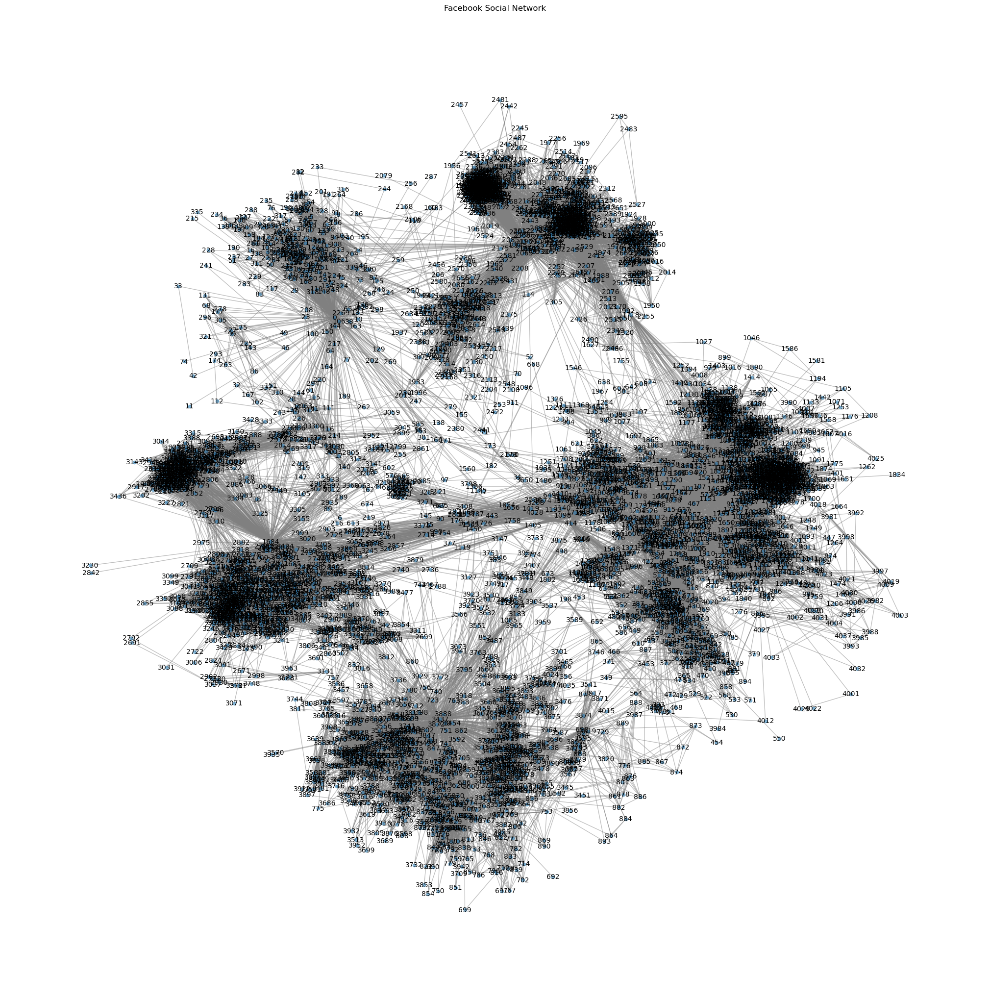

In [3]:
# visualize the overall network
plt.figure(figsize = (20, 20))

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw(G, pos, with_labels = False, node_size = 20, edge_color = 'gray', alpha = 0.5)

labels = {node: node for node in list(G.nodes())[:4039]}
nx.draw_networkx_labels(G, pos, labels = labels, font_size = 10, font_color = 'black')

plt.title("Facebook Social Network")
plt.show()

## Determine the degree of the network ##

### Top 10 nodes with the highest degree ###

In [4]:
# top 10 nodes by degree
degree_dict = dict(G.degree())
top_10_nodes_degree = sorted(degree_dict.items(), key = lambda x: x[1], reverse = True)[:10]
top_10_df = pd.DataFrame(top_10_nodes_degree, columns = ["Node", "Degree"])

print(top_10_df.to_string(index = False))


 Node  Degree
  107    1045
 1684     792
 1912     755
 3437     547
    0     347
 2543     294
 2347     291
 1888     254
 1800     245
 1663     235


C:\Users\kamar\AppData\Local\Temp\ipykernel_33708\3199411073.py:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label = "Normalized Degree")


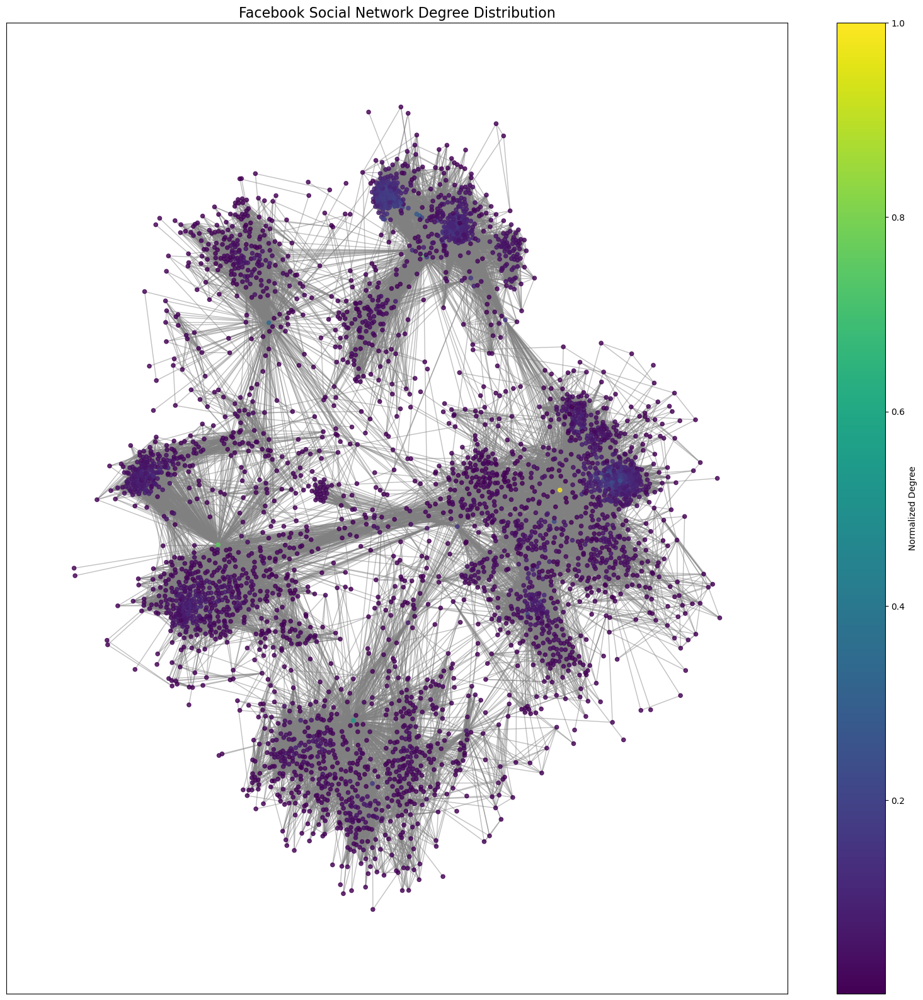

In [5]:
plt.figure(figsize = (20, 20))

node_colors = [degree_dict[node] for node in G.nodes()]
max_degree = max(node_colors)
node_colors = [color / max_degree for color in node_colors]

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw_networkx_nodes(G, pos, node_size = 20, node_color = node_colors, cmap = plt.cm.viridis, alpha = 0.8)

nx.draw_networkx_edges(G, pos, edge_color = 'gray', alpha = 0.5)

sm = plt.cm.ScalarMappable(cmap = plt.cm.viridis, norm = plt.Normalize(vmin = min(node_colors), vmax = 1))
sm.set_array([])
plt.colorbar(sm, label = "Normalized Degree")

plt.title("Facebook Social Network Degree Distribution", fontsize = 16)
plt.show()

## Determine the Minimum Spanning Tree (MST) ##

In [6]:
mst = nx.minimum_spanning_tree(G)

sorted_mst_edges = sorted(mst.edges(data = True), key = lambda x: x[2].get('weight', 1), reverse = True)

top_10_mst_edges = sorted_mst_edges[:10]
top_10_mst_edges

[(0, 1, {}),
 (0, 2, {}),
 (0, 3, {}),
 (0, 4, {}),
 (0, 5, {}),
 (0, 6, {}),
 (0, 7, {}),
 (0, 8, {}),
 (0, 9, {}),
 (0, 10, {})]

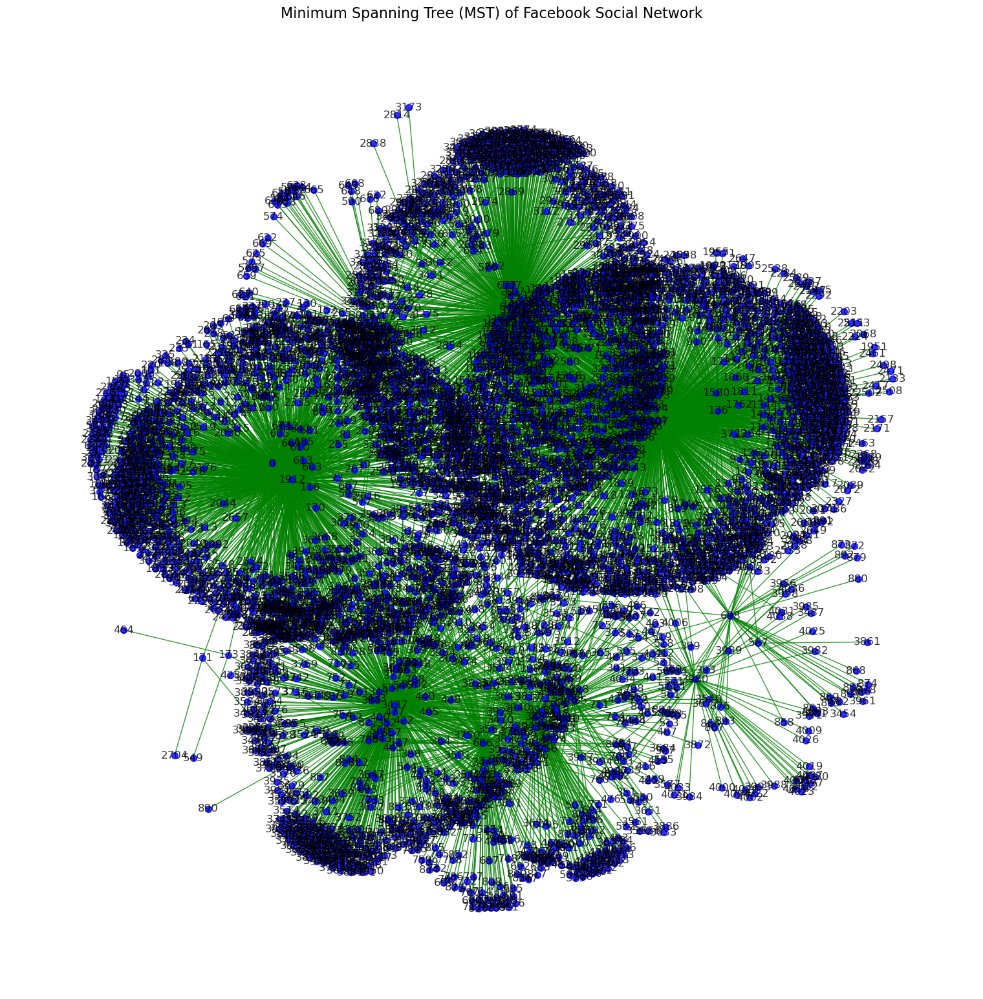

In [7]:
plt.figure(figsize = (15, 15))

pos = nx.spring_layout(mst, seed = 42, k = 0.1)

nx.draw(mst, pos, with_labels = True, node_size = 50, node_color = 'blue', edge_color = 'green', alpha = 0.8)

plt.title("Minimum Spanning Tree (MST) of Facebook Social Network", fontsize = 16)
plt.show()

### The importance of MST to this network ###

+ The MST identifies the minimum set of connections required to ensure that every user in the network is reachable. This could represent the most efficient pathways for disseminating updates, viral posts or critical announcements across Facebook's vast user base without redundancy.

+ Nodes that act as major hubs or connectors in the MST are likely influential users or profiles with significants reach. These users could represent important influencers of moderators in the social network.

+ The clusters visible in the MST highlight groups of users who are closely connected, representing communities, friend groups or regional clusters within Facebook. Understanding these clusters can help refine its recommmendation algorithms for contents, friends and groups.

+ The MST could provide insights into how information spreads efficiently within the network. Viral content often follows path similar to those in the MST, leveraging key users and connections to propagate quickly.

## Determine the shortest path of the network ##

In [8]:
# choose the nodes with the highest degree from MST
node_1 = top_10_nodes_degree[0][0]
node_2 = top_10_nodes_degree[1][0]

shortest_path = nx.shortest_path(G, source = node_1, target = node_2)

shortest_path_length = len(shortest_path) - 1

shortest_path, shortest_path_length

([107, 1684], 1)

This indicates that these two nodes are directly connected in the network, highlighting a strong link between these highly influential nodes.

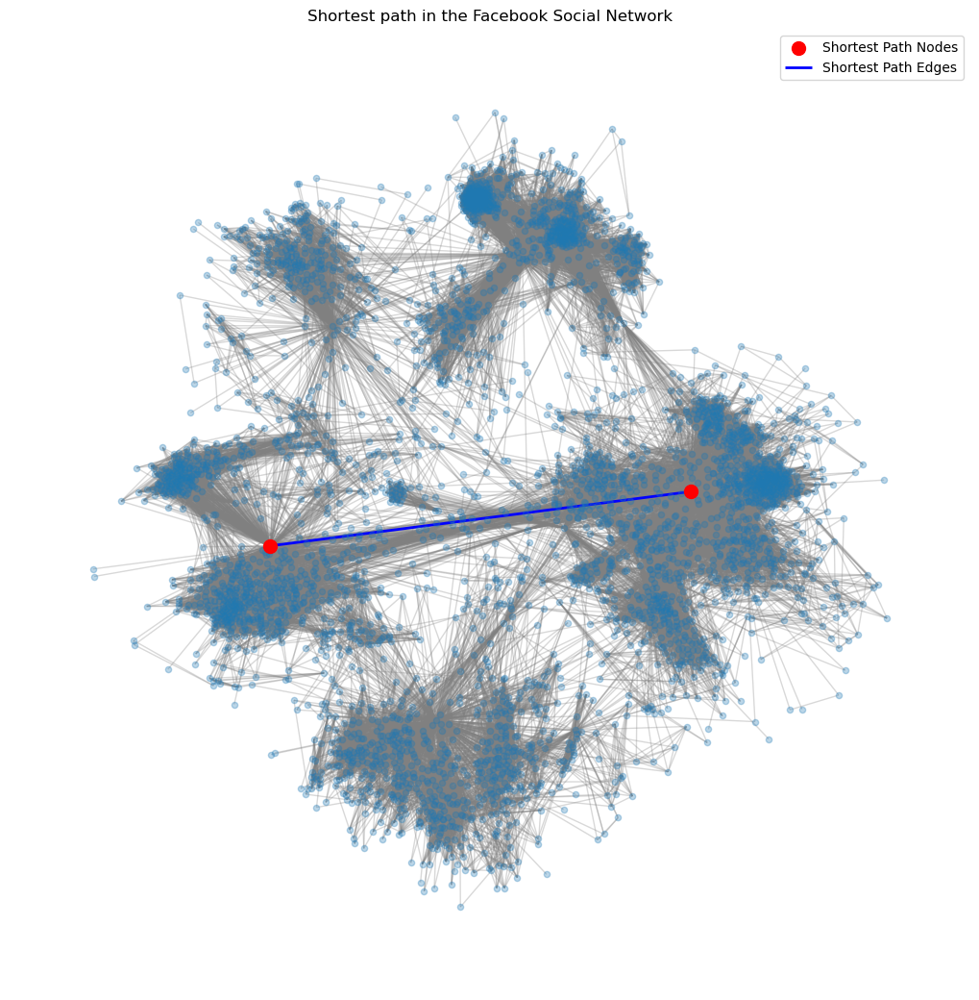

In [9]:
plt.figure(figsize = (10, 10))

shortest_path_edges = [(shortest_path[i], shortest_path[i + 1]) for i in range(len(shortest_path) - 1)]

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw(G, pos, with_labels = False, node_size = 20, edge_color = 'gray', alpha = 0.3)

nx.draw_networkx_nodes(G, pos, nodelist = shortest_path, node_size = 100, node_color = 'red', label = "Shortest Path Nodes")

nx.draw_networkx_edges(G, pos, edgelist = shortest_path_edges, width = 2, edge_color = 'blue', label = "Shortest Path Edges")

plt.legend(loc = "best")
plt.title("Shortest path in the Facebook Social Network")
plt.show()

In [ ]:
# using Dijikstra's algorithm
shortest_paths = dict(nx.all_pairs_dijkstra_path_length(G))

shortest_paths_summary = {node: len(paths) for node, paths in shortest_paths.items()}

total_pairs = sum(shortest_paths_summary.values())

shortest_paths_summary, total_pairs

### Average shortest path ###

In [ ]:
def load_graph_from_file(file_path):
    G = nx.Graph()
    with open(file_path, 'r') as f:
        for line in f:
            node1, node2 = map(int, line.strip().split())
            G.add_edge(node1, node2)
    return G

data_file_path = 'facebook_combined.txt'

G = load_graph_from_file(data_file_path)

if nx.is_connected(G):
    avg_shortest_path_length = nx.average_shortest_path_length(G)
    print(f"The average shortest path length of the network is: {avg_shortest_path_length}")
else:
    print("The graph is not connected, so the average shortest path length is undefined.")

## Determine the Clustering Coefficient of the network ##

In [ ]:
clustering_coefficients = nx.clustering(G)

sorted_clustering = sorted(clustering_coefficients.items(), key = lambda x: x[1], reverse = True)

top_10_clustering = sorted_clustering[:10]
df_top_10_clustering = pd.DataFrame(top_10_clustering, columns = ["Node", "Clustering Coefficient"])

average_clustering = nx.average_clustering(G)

df_top_10_clustering, average_clustering

This indicates that on average **60.55%** of a node's neighbours are also connected to each other, reflecting a moderate level of clustering within the network.

## Determine the degree centrality, closeness centrality, betweenness centrality and eigenvector centrality of the network ##

### 1. Degree Centrality ###

In [ ]:
degree_centrality = nx.degree_centrality(G)

sorted_degree_centrality = sorted(degree_centrality.items(), key = lambda x: x[1], reverse = True)

top_10_degree_centrality = sorted_degree_centrality[:10]

df_top_10_degree_centrality = pd.DataFrame(top_10_degree_centrality, columns = ["Node", "Degree Centrality"])

df_top_10_degree_centrality

In [ ]:
plt.figure(figsize = (20, 20))

node_colors = [degree_centrality[node] for node in G.nodes()]

max_centrality = max(node_colors)

node_colors = [color / max_centrality for color in node_colors]

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw_networkx_nodes(G, pos, node_size = 20, node_color = node_colors, cmap = plt.cm.viridis, alpha = 0.8)

nx.draw_networkx_edges(G, pos, edge_color = 'gray', alpha = 0.5)

sm = plt.cm.ScalarMappable(cmap = plt.cm.viridis, norm = plt.Normalize(vmin = min(node_colors), vmax = 1))
sm.set_array([])
plt.colorbar(sm, label = "Normalized Degree Centrality")

plt.title("Network Visualization with Degree Centrality")
plt.show()

### 2. Closeness Centrality ###

In [ ]:
closeness_centrality = nx.closeness_centrality(G)

sorted_closeness_centrality = sorted(closeness_centrality.items(), key = lambda x: x[1], reverse = True)

top_10_closeness_centrality = sorted_closeness_centrality[:10]

df_top_10_closeness_centrality = pd.DataFrame(top_10_closeness_centrality, columns = ["Node", "Closeness Centrality"])

df_top_10_closeness_centrality

In [ ]:
plt.figure(figsize = (20, 20))

node_colors = [closeness_centrality[node] for node in G.nodes()]

max_centrality = max(node_colors)

node_colors = [color / max_centrality for color in node_colors]

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw_networkx_nodes(G, pos, node_size = 20, node_color = node_colors, cmap = plt.cm.viridis, alpha = 0.8)

nx.draw_networkx_edges(G, pos, edge_color = 'gray', alpha = 0.5)

sm = plt.cm.ScalarMappable(cmap = plt.cm.viridis, norm = plt.Normalize(vmin = min(node_colors), vmax = 1))
sm.set_array([])
plt.colorbar(sm, label = "Normalized Closeness Centrality")

plt.title("Network Visualization with Closeness Centrality")
plt.show()

### 3. Betweenness Centrality ###

In [ ]:
betweenness_centrality = nx.betweenness_centrality(G)

sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key = lambda x: x[1], reverse = True)

top_10_betweenness_centrality = sorted_betweenness_centrality[:10]

df_top_10_betweenness_centrality = pd.DataFrame(top_10_betweenness_centrality, columns = ["Node", "Betweenness Centrality"])

df_top_10_betweenness_centrality

In [ ]:
plt.figure(figsize = (20, 20))

node_colors = [betweenness_centrality[node] for node in G.nodes()]

max_centrality = max(node_colors)

node_colors = [color / max_centrality for color in node_colors]

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw_networkx_nodes(G, pos, node_size = 20, node_color = node_colors, cmap = plt.cm.viridis, alpha = 0.8)

nx.draw_networkx_edges(G, pos, edge_color = 'gray', alpha = 0.5)

sm = plt.cm.ScalarMappable(cmap = plt.cm.viridis, norm = plt.Normalize(vmin = min(node_colors), vmax = 1))
sm.set_array([])
plt.colorbar(sm, label = "Normalized Betweenness Centrality")

plt.title("Network Visualization with Betweenness Centrality")
plt.show()

### 4. Eigenvector Centrality ###

In [ ]:
eigenvector_centrality = nx.eigenvector_centrality(G)

sorted_eigenvector_centrality = sorted(eigenvector_centrality.items(), key = lambda x: x[1], reverse = True)

top_10_eigenvector_centrality = sorted_eigenvector_centrality[:10]

df_top_10_eigenvector_centrality = pd.DataFrame(top_10_eigenvector_centrality, columns = ["Node", "Eigenvector Centrality"])

df_top_10_eigenvector_centrality

In [ ]:
plt.figure(figsize = (20, 20))

node_colors = [eigenvector_centrality[node] for node in G.nodes()]

max_centrality = max(node_colors)

node_colors = [color / max_centrality for color in node_colors]

pos = nx.spring_layout(G, seed = 42, k = 0.1)

nx.draw_networkx_nodes(G, pos, node_size = 20, node_color = node_colors, cmap = plt.cm.viridis, alpha = 0.8)

nx.draw_networkx_edges(G, pos, edge_color = 'gray', alpha = 0.5)

sm = plt.cm.ScalarMappable(cmap = plt.cm.viridis, norm = plt.Normalize(vmin = min(node_colors), vmax = 1))
sm.set_array([])
plt.colorbar(sm, label = "Normalized Eigenvector Centrality")

plt.title("Network Visualization with Eigenvector Centrality")
plt.show()

##  Determine the random network ##

In [ ]:
graph = nx.read_edgelist(file_path, nodetype = int)

N = graph.number_of_nodes()

degrees = [deg for _, deg in graph.degree()]
k_avg = np.mean(degrees)

p = k_avg / (N - 1)

random_graph = nx.gnp_random_graph(N, p, seed = 42)

output = {
    "Number of Nodes (N)": N,
    "Average Degree (<k>)": k_avg,
    "Probability (p)": p,
    "Random Graph Summary": {
        "Nodes": random_graph.number_of_nodes(),
        "Edges": random_graph.number_of_edges()
    }
}

output

### Comparing the degree distribution, clustering coefficient and average path length of the random network ###

In [ ]:
degree_distribution = [deg for _, deg in random_graph.degree()]
degree_histogram = np.bincount(degree_distribution)

clustering_coefficient = nx.average_clustering(random_graph)

if nx.is_connected(random_graph):
    average_path_length = nx.average_shortest_path_length(random_graph)
else:
    largest_cc = max(nx.connected_components(random_graph), key = len)
    subgraph = random_graph.subgraph(largest_cc)
    average_path_length = nx.average_shortest_path_length(subgraph)
    
results = {
    "Degree Distribution (Histogram)": degree_histogram.tolist(),
    "Clustering Coefficient": clustering_coefficient,
    "Average Path Length": average_path_length
}

results

In [ ]:
plt.figure(figsize = (10, 6))
plt.bar(range(len(degree_histogram)), degree_histogram, width = 1.0, edgecolor = "black")
plt.title("Degree Distribution of the Random Graph")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes")
plt.grid(axis = "y")
plt.show()

In [ ]:
real_degree_distribution = [deg for _, deg in graph.degree()]
real_degree_histogram = np.bincount(real_degree_distribution)

real_clustering_coefficient = nx.average_clustering(graph)

if nx.is_connected(graph):
    real_average_path_length = nx.average_shortest_path_length(graph)
else:
    largest_cc_real = max(nx.connected_components(graph), key = len)
    real_subgraph = graph.subgraph(largest_cc_real)
    real_average_path_length = nx.average_shortest_path_length(real_subgraph)
    
comparison = {
    "Random Graph": {
        "Clustering Coefficient": clustering_coefficient,
        "Average Path Length": average_path_length,
        "Degree Distribution (Histogram)": degree_histogram.tolist()
    },
    "Real Network": {
        "Clustering Coefficient": real_clustering_coefficient,
        "Average Path Length": real_average_path_length,
        "Degree Distribution (Histogram)": real_degree_histogram.tolist()
    }
}

comparison

### Random Graph: ###

+ **Clustering Coefficient:** 0.010766417877051668
(low clustering)
+ **Average Path Length:** 2.6105048584620896
(short, indicates a small-world like property)
+ **Degree Distribution:** Uniform with peak around the average degree

### Real Network ###

+ **Clustering Coefficient:** 0.6055467186200876
(much higher clustering, more structured network)
+ **Average Path Length:** 3.6925068496963913
(slightly longer, reflecting community structures and network modularity)
+ **Degree Distribution:** Skewed with heavy tail, suggest power-law or scale-free distribution

In [ ]:
max_degree_random = len(degree_histogram) - 1
max_degree_real = len(real_degree_histogram) - 1
max_degree = max(max_degree_random, max_degree_real)

random_degree_hist = np.pad(degree_histogram, (0, max_degree - max_degree_random), mode = 'constant')
real_degree_hist = np.pad(real_degree_histogram, (0, max_degree - max_degree_real), mode = 'constant')

plt.figure(figsize = (12, 8))
plt.bar(range(max_degree + 1), random_degree_hist, width = 0.4, label = 'Random Graph', alpha = 0.7, color = 'blue')
plt.bar(range(max_degree + 1), real_degree_hist, width = 0.4, label = 'Real Network', alpha = 0.7, color = 'red')
plt.yscale('log')
plt.title("Degree Distribution: Real Network vs Random Graph")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes (log scale)")
plt.legend()
plt.grid(axis = "y", linestyle = "--", alpha = 0.7)
plt.show()

## Generate Watt-Strogatz model ##

### p = 0.1 ###

In [ ]:
k_ws = int(round(k_avg))
p_ws = 0.1

ws_graph = nx.watts_strogatz_graph(N, k_ws, p_ws, seed = 42)

ws_graph_summary = {
    "Nodes": ws_graph.number_of_nodes(),
    "Edges": ws_graph.number_of_edges(),
    "Average Degree (k)": k_ws,
    "Rewiring Probability (p)": p_ws
}

ws_graph_summary

### Comparing the Watt-Strogatz model with the real network ###

In [ ]:
ws_degree_distribution = [deg for _, deg in ws_graph.degree()]
ws_degree_histogram = np.bincount(ws_degree_distribution)

ws_clustering_coefficient = nx.average_clustering(ws_graph)

if nx.is_connected(ws_graph):
    ws_average_path_length = nx.average_shortest_path_length(ws_graph)
else:
    largest_cc_ws = max(nx.connected_components(ws_graph), key = len)
    ws_subgraph = ws_graph.subgraph(largest_cc_ws)
    ws_average_path_length = nx.average_shortest_path_length(ws_subgraph)
    
comparison_ws = {
    "Watt-Strogatz Graph": {
        "Clustering Coefficient": ws_clustering_coefficient,
        "Average Path Length": ws_average_path_length,
        "Degree Distribution (Histogram)": ws_degree_histogram.tolist()
    },
    "Real Network": {
        "Clustering Coefficient": real_clustering_coefficient,
        "Average Path Length": real_average_path_length,
        "Degree Distribution (Histogram)": real_degree_histogram.tolist()
    }
}

comparison_ws

### Watt-Strogatz model: ###

+ **Clustering Coefficient:** 0.5347165950646476
(higher clustering, typical of small-world networks)
+ **Average Path Length:** 2.9647015153516216
(short, reflecting efficient connectivity)
+ **Degree Distribution:** Symmetrical and narrowly centered

### Real Network ###

+ **Clustering Coefficient:** 0.6055467186200876
(much higher clustering, more structured network)
+ **Average Path Length:** 3.6925068496963913
(slightly longer, reflecting community structures and network modularity)
+ **Degree Distribution:** Skewed with heavy tail, suggest power-law or scale-free distribution

In [ ]:
max_degree_ws = len(ws_degree_histogram) - 1
max_degree_real = len(real_degree_histogram) - 1
max_degree = max(max_degree_ws, max_degree_real)

ws_degree_hist = np.pad(ws_degree_histogram, (0, max_degree - max_degree_ws), mode='constant')
real_degree_hist = np.pad(real_degree_histogram, (0, max_degree - max_degree_real), mode='constant')

plt.figure(figsize=(12, 8))
plt.bar(range(max_degree + 1), ws_degree_hist, width=0.4, label='Watt-Strogatz Graph', alpha=0.7, color='green')
plt.bar(range(max_degree + 1), real_degree_hist, width=0.4, label='Real Network', alpha=0.7, color='red')
plt.yscale('log')  # Use a logarithmic scale to better visualize the distributions
plt.title("Degree Distribution: Watt-Strogatz Model vs Real Network")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes (log scale)")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [ ]:
# Define the range of rewiring probabilities
rewiring_probabilities = [0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

# Initialize a list to store results
ws_results = []

# Calculate metrics for each rewiring probability
for p_ws in rewiring_probabilities:
    # Generate a new Watt-Strogatz graph for each probability
    ws_graph = nx.watts_strogatz_graph(N, k_ws, p_ws, seed=42)
    
    # Calculate clustering coefficient
    clustering_coefficient = nx.average_clustering(ws_graph)
    
    # Calculate average path length (handle disconnected graphs)
    if nx.is_connected(ws_graph):
        avg_path_length = nx.average_shortest_path_length(ws_graph)
    else:
        # Calculate for the largest connected component
        largest_cc_ws = max(nx.connected_components(ws_graph), key=len)
        subgraph = ws_graph.subgraph(largest_cc_ws)
        avg_path_length = nx.average_shortest_path_length(subgraph)
    
    # Append results
    ws_results.append({
        "Rewiring Probability (p)": p_ws,
        "Average Clustering Coefficient": clustering_coefficient,
        "Average Shortest Path Length": avg_path_length
    })

# Convert results to a DataFrame for better visualization
import pandas as pd
ws_results_df = pd.DataFrame(ws_results)

ws_results_df

In [ ]:
plt.figure(figsize=(12, 8))

plt.plot(ws_results_df["Rewiring Probability (p)"],
         ws_results_df["Average Clustering Coefficient"],
         marker='o', label="Clustering Coefficient")

plt.plot(ws_results_df["Rewiring Probability (p)"],
         ws_results_df["Average Shortest Path Length"],
         marker='s', label="Average Shortest Path Length")

plt.title("Watt-Strogatz Model Metrics by Rewiring Probability")
plt.xlabel("Rewiring Probability (p)")
plt.ylabel("Metric Value")
plt.xscale('log')  
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)

plt.show()

## Generate Barabasi-Albert model ##

In [ ]:
m_ba = int(round(k_avg / 2))

ba_graph = nx.barabasi_albert_graph(N, m_ba, seed = 42)

ba_graph_summary = {
    "Nodes": ba_graph.number_of_nodes(),
    "Edges": ba_graph.number_of_edges(),
    "Edges per New Node (m)": m_ba
}

ba_graph_summary

In [ ]:
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(ba_graph, seed=42)  
nx.draw(
    ba_graph, pos,
    node_size=10,  # Small nodes for better clarity
    edge_color="gray",
    node_color="blue",
    alpha=0.7,
    with_labels=False
)
plt.title("Visualization of the Barabási-Albert Model Graph")
plt.show()

### Comparing the Barabasi-Albert model with the real network ###

In [ ]:
ba_degree_distribution = [deg for _, deg in ba_graph.degree()]
ba_degree_histogram = np.bincount(ba_degree_distribution)

ba_clustering_coefficient = nx.average_clustering(ba_graph)

if nx.is_connected(ba_graph):
    ba_average_path_length = nx.average_shortest_path_length(ba_graph)
else:
    largest_cc_ba = max(nx.connected_components(ba_graph), key=len)
    ba_subgraph = ba_graph.subgraph(largest_cc_ba)
    ba_average_path_length = nx.average_shortest_path_length(ba_subgraph)

comparison_ba = {
    "Barabási-Albert Graph": {
        "Clustering Coefficient": ba_clustering_coefficient,
        "Average Path Length": ba_average_path_length,
        "Degree Distribution (Histogram)": ba_degree_histogram.tolist()
    },
    "Real Network": {
        "Clustering Coefficient": real_clustering_coefficient,
        "Average Path Length": real_average_path_length,
        "Degree Distribution (Histogram)": real_degree_histogram.tolist()
    }
}

comparison_ba

In [ ]:
# Prepare data for visualization
max_degree_ba = len(ba_degree_histogram) - 1
max_degree_real = len(real_degree_histogram) - 1
max_degree_ws = len(ws_degree_histogram) - 1
max_degree = max(max_degree_ba, max_degree_real, max_degree_ws)

# Align histograms
ba_degree_hist = np.pad(ba_degree_histogram, (0, max_degree - max_degree_ba), mode='constant')
real_degree_hist = np.pad(real_degree_histogram, (0, max_degree - max_degree_real), mode='constant')
ws_degree_hist = np.pad(ws_degree_histogram, (0, max_degree - max_degree_ws), mode='constant')

# Plot degree distributions
plt.figure(figsize=(14, 10))

plt.bar(range(max_degree + 1), real_degree_hist, width=0.4, label='Real Network', alpha=0.7, color='red')
plt.bar(range(max_degree + 1), ba_degree_hist, width=0.4, label='Barabási-Albert Model', alpha=0.7, color='blue')
plt.bar(range(max_degree + 1), ws_degree_hist, width=0.4, label='Watt-Strogatz Model', alpha=0.7, color='green')

plt.yscale('log')  # Log scale for better visualization
plt.title("Degree Distribution Comparison")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes (log scale)")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

# Plot clustering coefficient and average path length comparison
metrics = ['Clustering Coefficient', 'Average Path Length']
real_values = [real_clustering_coefficient, real_average_path_length]
ba_values = [ba_clustering_coefficient, ba_average_path_length]
ws_values = [ws_clustering_coefficient, ws_average_path_length]

x = np.arange(len(metrics))  # Label locations
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width, real_values, width, label='Real Network', color='red', alpha=0.7)
ax.bar(x, ba_values, width, label='Barabási-Albert Model', color='blue', alpha=0.7)
ax.bar(x + width, ws_values, width, label='Watt-Strogatz Model', color='green', alpha=0.7)

ax.set_ylabel("Metric Value")
ax.set_title("Clustering Coefficient and Average Path Length Comparison")
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()
ax.grid(axis='y', linestyle="--", alpha=0.7)

plt.show()

## Generating the Configuration Model of the network ##

In [ ]:
degree_sequence = [d for n, d in graph.degree()]

config_model_graph = nx.configuration_model(degree_sequence)
config_model_graph = nx.Graph(config_model_graph)
config_model_graph.remove_edges_from(nx.selfloop_edges(config_model_graph))

original_node_count = graph.number_of_nodes()
original_edge_count = graph.number_of_edges()
config_node_count = config_model_graph.number_of_nodes()
config_edge_count = config_model_graph.number_of_edges()

output = {
    "Original Graph": {
        "Number of Nodes": original_node_count,
        "Number of Edges": original_edge_count
    },
    "Configuration Model Graph": {
        "Number of Nodes": config_node_count,
        "Number of Edges": config_edge_count
    }
}

output

This configuration model maintains the same degree distribution as the original Facebook Social Network graph while randomly rewiring edges with the total of **85630 edges**.

### Comparing the configuration model to the real network ###

In [ ]:
degree_sequence = [d for n, d in graph.degree()]

config_model_graph = nx.configuration_model(degree_sequence)
config_model_graph = nx.Graph(config_model_graph)
config_model_graph.remove_edges_from(nx.selfloop_edges(config_model_graph))

betweenness_centrality_original = nx.betweenness_centrality(graph)
eigenvector_centrality_original = nx.eigenvector_centrality(graph, max_iter = 1000)
clustering_coefficient_original = nx.clustering(graph)

betweenness_centrality_config = nx.betweenness_centrality(config_model_graph)
eigenvector_centrality_config = nx.eigenvector_centrality(config_model_graph, max_iter = 1000)
clustering_coefficient_config = nx.clustering(config_model_graph)

comparison = {
    "Metric": ["Betweenness Centrality", "Eigenvector Centrality", "Clustering Coefficient"],
    "Original Graph": [
        sum(betweenness_centrality_original.values()) / len(betweenness_centrality_original),
        sum(eigenvector_centrality_original.values()) / len(eigenvector_centrality_original),
        sum(clustering_coefficient_original.values()) / len(clustering_coefficient_original),
    ],
    "Configuration Model Graph": [
        sum(betweenness_centrality_config.values()) / len(betweenness_centrality_config),
        sum(eigenvector_centrality_config.values()) / len(eigenvector_centrality_config),
        sum(clustering_coefficient_config.values()) / len(clustering_coefficient_config),
    ],
}

comparison_df = pd.DataFrame(comparison)

comparison_df

In [ ]:
metrics = ["Betweenness Centrality", "Eigenvector Centrality", "Clustering Coefficient"]
original_values = [
    sum(betweenness_centrality_original.values()) / len(betweenness_centrality_original),
    sum(eigenvector_centrality_original.values()) / len(eigenvector_centrality_original),
    sum(clustering_coefficient_original.values()) / len(clustering_coefficient_original),
]
config_model_values = [
    sum(betweenness_centrality_config.values()) / len(betweenness_centrality_config),
    sum(eigenvector_centrality_config.values()) / len(eigenvector_centrality_config),
    sum(clustering_coefficient_config.values()) / len(clustering_coefficient_config),
]

x = np.arange(len(metrics))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
bars1 = ax.bar(x - width/2, original_values, width, label='Original Graph')
bars2 = ax.bar(x + width/2, config_model_values, width, label='Configuration Model')

ax.set_xlabel('Metrics')
ax.set_ylabel('Average Value')
ax.set_title('Comparison of Centrality and Clustering Coefficient')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

plt.tight_layout()
plt.show()

## Determine the modularity of the network using Louvain Algorithm ##

In [ ]:
pip install python-louvain

In [ ]:
import networkx as nx
from community import community_louvain

partition = community_louvain.best_partition(graph)

modularity = community_louvain.modularity(partition, graph)

modularity

A modularity value of **0.8349619892505196** suggests that Facebook's social graph is highly modular, meaning users are grouped into tightly connected communities.
These communities might correspond to friend groups, family clusters, work colleagues, or shared-interest groups.

This modularity score reflects the natural clustering in human relationships, which is amplified on Facebook due to the platform's design and user behavior. This strong community structure underpins many of Facebook's successes in engagement and content distribution, while also posing challenges such as managing information silos and encouraging cross-community interactions.